In [1]:
from scipy.sparse import csr_matrix
from benchmark import datasets, dataset_io
import numpy as np
import matplotlib.pyplot as plt
from math import log2
from tqdm import tqdm

In [2]:
# yfcc = datasets.YFCC100MDataset()
yfcc = datasets.WikiParagraphDataset(10_000_000)

In [3]:
dataset_metadata = yfcc.get_dataset_metadata()
print(dataset_metadata)

  (0, 5)	1e-45
  (0, 6)	1e-45
  (0, 7)	1e-45
  (0, 28)	1e-45
  (0, 29)	1e-45
  (0, 65)	1e-45
  (0, 76)	1e-45
  (0, 128)	1e-45
  (0, 166)	1e-45
  (0, 212)	1e-45
  (0, 317)	1e-45
  (0, 331)	1e-45
  (0, 462)	1e-45
  (0, 524)	1e-45
  (0, 551)	1e-45
  (0, 578)	1e-45
  (0, 586)	1e-45
  (0, 633)	1e-45
  (0, 656)	1e-45
  (0, 825)	1e-45
  (0, 1069)	1e-45
  (0, 1345)	1e-45
  (0, 1598)	1e-45
  (0, 1672)	1e-45
  (0, 1831)	1e-45
  :	:
  (9999998, 39711)	1e-45
  (9999998, 44504)	1e-45
  (9999999, 2)	1e-45
  (9999999, 7)	1e-45
  (9999999, 50)	1e-45
  (9999999, 61)	1e-45
  (9999999, 67)	1e-45
  (9999999, 209)	1e-45
  (9999999, 255)	1e-45
  (9999999, 298)	1e-45
  (9999999, 364)	1e-45
  (9999999, 373)	1e-45
  (9999999, 579)	1e-45
  (9999999, 668)	1e-45
  (9999999, 1369)	1e-45
  (9999999, 1963)	1e-45
  (9999999, 1982)	1e-45
  (9999999, 2132)	1e-45
  (9999999, 2188)	1e-45
  (9999999, 2288)	1e-45
  (9999999, 2324)	1e-45
  (9999999, 2797)	1e-45
  (9999999, 3264)	1e-45
  (9999999, 3812)	1e-45
  (9999999, 243

In [4]:
transpose_metadata_full = dataset_metadata.transpose().tocsr()
print(transpose_metadata_full.shape)
# print(dataset_metadata.shape)

(57388, 10000000)


In [5]:
points_per_label_full = [frozenset(transpose_metadata_full.indices[transpose_metadata_full.indptr[i]:transpose_metadata_full.indptr[i+1]]) for i in tqdm(range(transpose_metadata_full.shape[0]))]

100%|██████████| 57388/57388 [01:40<00:00, 573.87it/s]  


In [6]:
np.max([len(x) for x in points_per_label_full])

2194824

In [7]:
dataset_metadata.shape

(10000000, 57388)

In [8]:
# compute the number of data points associated with each label
n_assoc_full = n_assoc = dataset_metadata.getnnz(axis=0)
print("n_assoc", n_assoc.shape, n_assoc.min(), n_assoc.max())

n_assoc (57388,) 0 2194824


In [9]:
# compute the number of filters per data point
n_filters_full = n_filters = dataset_metadata.getnnz(axis=1)
print(n_filters)

[33 47 14 ...  4 52 23]


In [10]:
# we want to examine the case where we restrict to filters which are associated with at least CUTOFF_SIZE vectors
CUTOFF_SIZE = 20000

# cutoffs = [2**i for i in range(21)] 
cutoffs = [0, 1_000, 5_000, 10_000, 15_000, 20_000, 25_000, 30_000, 35_000, 40_000, 45_000, 50_000, 75_000, 100_000, 150_000, 200_000, 250_000, 300_000, 350_000, 400_000, 500_000, 1_000_000]

# identifying sufficiently frequent labels for a range of cutoff sizes so they can be easily compared
large_filters = {cutoff : np.where(n_assoc >= cutoff)[0] for cutoff in cutoffs}
print(cutoffs)
for k, v in large_filters.items():
    print(f"{len(v):,} filters with at least {k:,} points")
# print(f"{len(large_filters):,} filters with at least {CUTOFF_SIZE:,} points")
# count nonzero values for each cutoff
for k, v in large_filters.items():
    connections = dataset_metadata[:, v].getnnz(axis=1)
    print(f"{k:,} cutoff: {np.sum(connections):,} nonzero values (avg. {np.sum(connections) / len(v):,.0f} points per filter)")

[0, 1000, 5000, 10000, 15000, 20000, 25000, 30000, 35000, 40000, 45000, 50000, 75000, 100000, 150000, 200000, 250000, 300000, 350000, 400000, 500000, 1000000]
57,388 filters with at least 0 points
19,445 filters with at least 1,000 points
7,012 filters with at least 5,000 points
4,255 filters with at least 10,000 points
3,076 filters with at least 15,000 points
2,382 filters with at least 20,000 points
1,951 filters with at least 25,000 points
1,634 filters with at least 30,000 points
1,391 filters with at least 35,000 points
1,209 filters with at least 40,000 points
1,067 filters with at least 45,000 points
955 filters with at least 50,000 points
585 filters with at least 75,000 points
407 filters with at least 100,000 points
237 filters with at least 150,000 points
157 filters with at least 200,000 points
116 filters with at least 250,000 points
69 filters with at least 300,000 points
51 filters with at least 350,000 points
43 filters with at least 400,000 points
23 filters with at l

In [11]:
# recomputing the dataset metadata to only include these labels
dataset_metadata_full = dataset_metadata
dataset_metadata = dataset_metadata[:, large_filters[CUTOFF_SIZE]]
print(dataset_metadata.shape)

(10000000, 2382)


In [12]:
# compute the number of data points associated with each label
n_assoc = dataset_metadata.getnnz(axis=0)
print("n_assoc", n_assoc.shape, n_assoc.min(), n_assoc.max())

n_assoc (2382,) 20014 2194824


In [13]:
# compute the number of filters per data point
n_filters = dataset_metadata.getnnz(axis=1)
print(n_filters)

[25 28  9 ...  3 39 17]


## Labels per Point

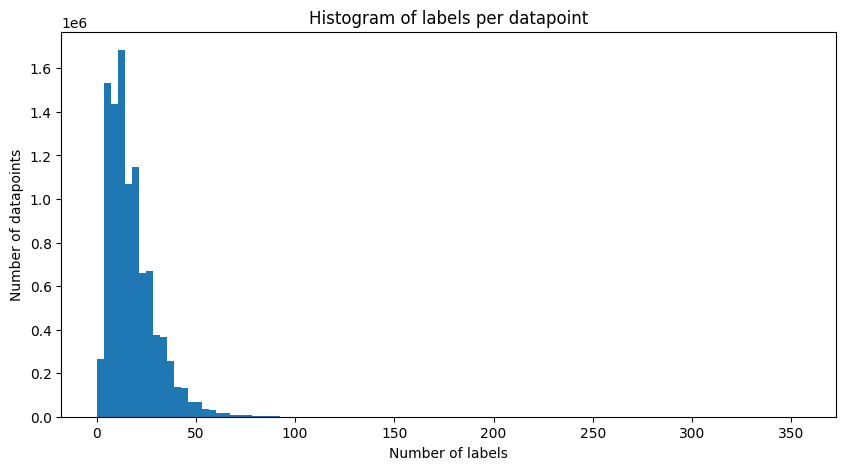

In [14]:
# plot histogram of labels per datapoint
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_filters, bins=100)
ax.set_title("Histogram of labels per datapoint")
ax.set_xlabel("Number of labels")
ax.set_ylabel("Number of datapoints")
# ax.set_yscale("log")
plt.show()

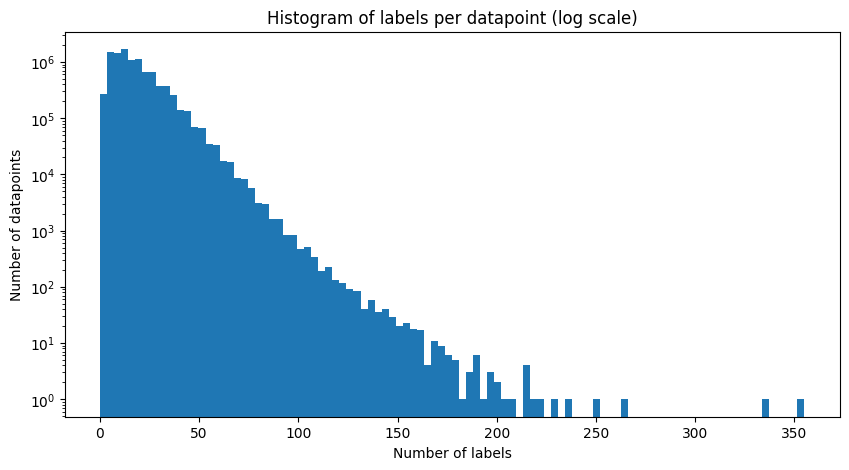

In [15]:
# plot histogram of labels per datapoint
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_filters, bins=100)
ax.set_title("Histogram of labels per datapoint (log scale)")
ax.set_xlabel("Number of labels")
ax.set_ylabel("Number of datapoints")
ax.set_yscale("log")
plt.show()
#this is a comment

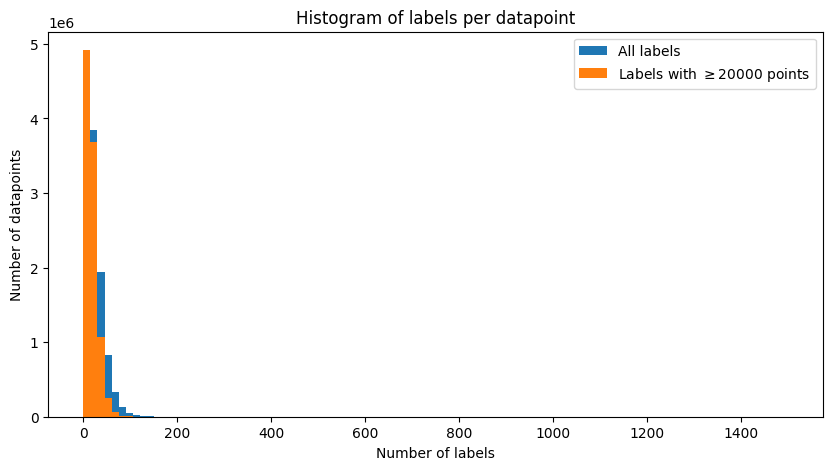

In [16]:
# plot histograms of labels per datapoint for n_filters and n_filters_full on the same axes
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_filters_full, bins=100, label="All labels", range=(0, 1500))
ax.hist(n_filters, bins=100,  label=f"Labels with $\\geq {CUTOFF_SIZE}$ points", range=(0, 1500))
ax.set_title("Histogram of labels per datapoint")
ax.set_xlabel("Number of labels")
ax.set_ylabel("Number of datapoints")
# ax.set_yscale("log")
ax.legend()
plt.show()

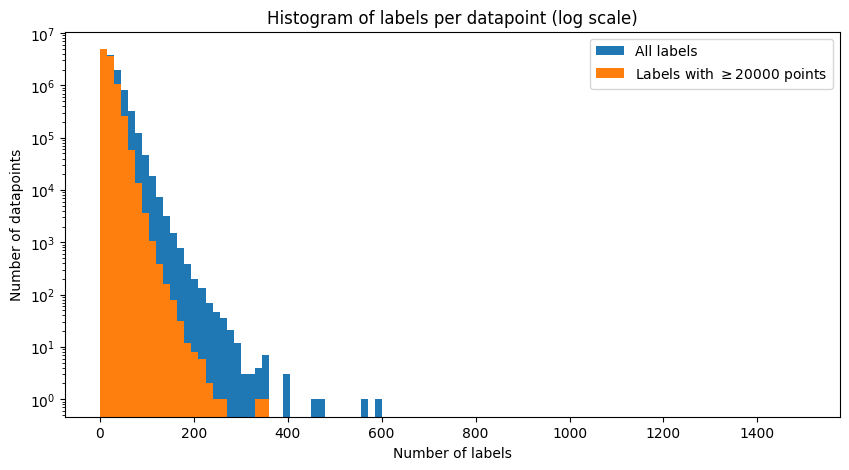

In [17]:
# plot histograms of labels per datapoint for n_filters and n_filters_full on the same axes
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_filters_full, bins=100, label="All labels", range=(0, 1500))
ax.hist(n_filters, bins=100,  label=f"Labels with $\\geq {CUTOFF_SIZE}$ points", range=(0, 1500))
ax.set_title("Histogram of labels per datapoint (log scale)")
ax.set_xlabel("Number of labels")
ax.set_ylabel("Number of datapoints")
ax.set_yscale("log")
ax.legend()
plt.show()

In [18]:
# print(f"min: {min(n_filters)}, max: {max(n_filters)}, mean: {np.mean(n_filters)}, median: {np.median(n_filters)}")
print(f"min: {min(n_filters)}\nmax: {max(n_filters):,}\nmean: {np.mean(n_filters):.3}\nmedian: {int(np.median(n_filters))}")

min: 0
max: 355
mean: 17.5
median: 15


0 (0.000%) points with at least 1,000 labels
0 (0.000%) points with at least 500 labels
4 (0.000%) points with at least 250 labels
2,497 (0.025%) points with at least 100 labels
203,277 (2.033%) points with at least 50 labels
2,210,718 (22.107%) points with at least 25 labels
7,234,073 (72.341%) points with at least 10 labels
9,470,393 (94.704%) points with at least 5 labels
9,735,627 (97.356%) points with at least 4 labels
9,891,944 (98.919%) points with at least 3 labels
9,965,723 (99.657%) points with at least 2 labels
9,991,376 (99.914%) points with at least 1 labels



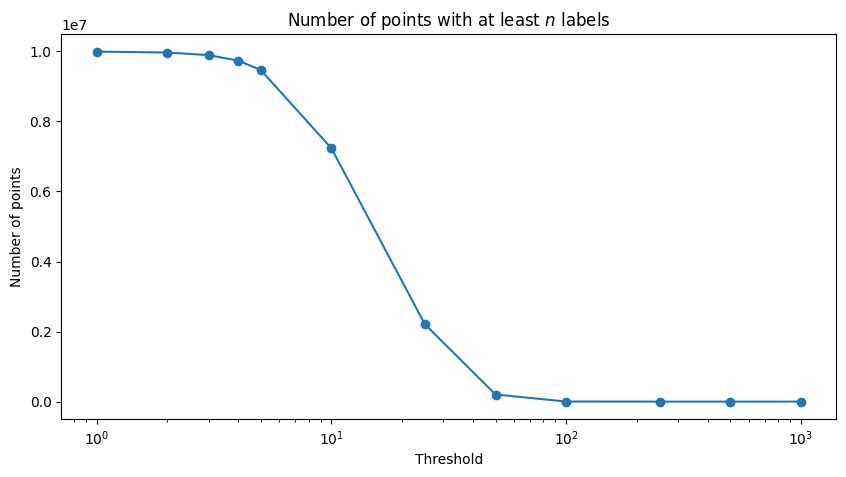

In [19]:
thresholds = [1000, 500, 250, 100, 50, 25, 10, 5, 4, 3, 2, 1]
# thresholds = [10**(e/4) for e in range(0, 16)]
qualifying = []
for threshold in thresholds:
    qualifying.append(np.sum(np.array(n_filters) >= threshold))
output = ""
for t, n in zip(thresholds, qualifying):
    output += f"{n:,} ({n / len(n_filters) * 100:.3f}%) points with at least {t:,} labels\n"
print(output)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(thresholds, qualifying, "o-")
ax.set_xscale("log")
# ax.set_yscale("log")
ax.set_xlabel("Threshold")
ax.set_ylabel("Number of points")
ax.set_title("Number of points with at least $n$ labels")
plt.show()

In [20]:
quantiles = [0.025, 0.05, 0.125, 0.25, 0.5, 0.75, 0.875, 0.95, 0.99, 0.999, 1.]
for q, n in zip(quantiles, np.quantile(n_filters, quantiles)):
    print(f"{q:.3f}: {n:.0f}")

0.025: 3
0.050: 4
0.125: 6
0.250: 9
0.500: 15
0.750: 23
0.875: 31
0.950: 40
0.990: 57
0.999: 82
1.000: 355


## Points Per Label

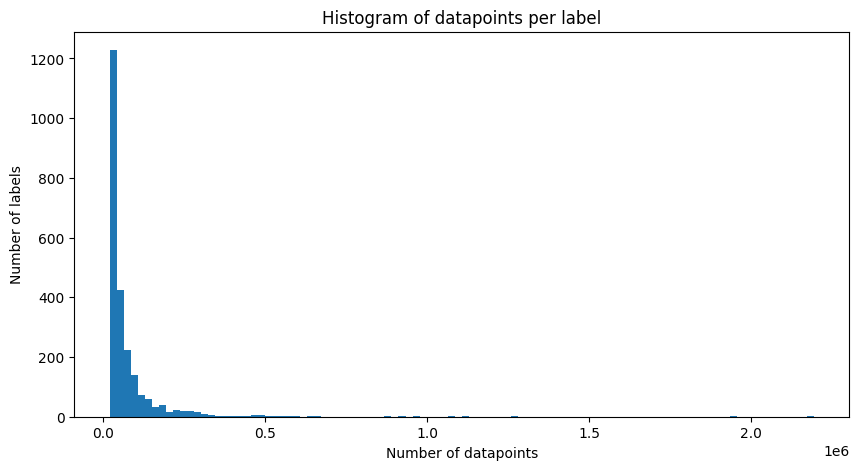

In [21]:
# plot histogram of points per label
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_assoc, bins=100)
ax.set_title("Histogram of datapoints per label")
ax.set_xlabel("Number of datapoints")
ax.set_ylabel("Number of labels")
# ax.set_yscale("log")
plt.show()

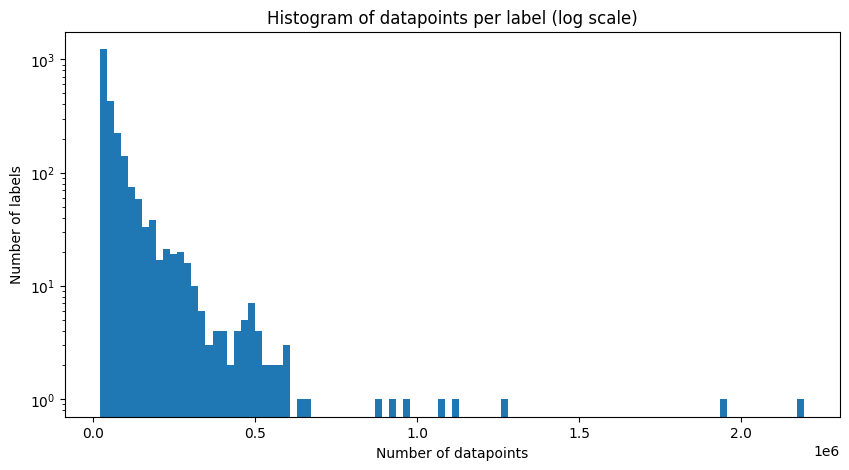

In [22]:
# plot histogram of points per label
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_assoc, bins=100)
ax.set_title("Histogram of datapoints per label (log scale)")
ax.set_xlabel("Number of datapoints")
ax.set_ylabel("Number of labels")
ax.set_yscale("log")
plt.show()

In [23]:
print(f"min: {min(n_assoc):,} ({min(n_assoc) / dataset_metadata.shape[0] * 100:.3f}%),\nmax: {max(n_assoc):,} ({max(n_assoc) / dataset_metadata.shape[0] * 100:.3f}%),\nmean: {np.mean(n_assoc):.2f} ({np.mean(n_assoc) / dataset_metadata.shape[0] * 100:.3f}%),\nmedian: {np.median(n_assoc):,} ({np.median(n_assoc) / dataset_metadata.shape[0] * 100:.3f}%)")

min: 20,014 (0.200%),
max: 2,194,824 (21.948%),
mean: 73658.31 (0.737%),
median: 40,679.0 (0.407%)


In [24]:
k = 25
top_k = np.sort(n_assoc, axis=0)[-k:]
top_k = top_k[::-1]

for i, s in enumerate(top_k):
    print(f" {i+1}. {s / dataset_metadata.shape[0] * 100:.3f}%")

 1. 21.948%
 2. 19.513%
 3. 12.738%
 4. 11.085%
 5. 10.720%
 6. 9.704%
 7. 9.274%
 8. 8.859%
 9. 6.552%
 10. 6.319%
 11. 6.005%
 12. 5.962%
 13. 5.931%
 14. 5.701%
 15. 5.637%
 16. 5.507%
 17. 5.426%
 18. 5.341%
 19. 5.224%
 20. 5.160%
 21. 5.109%
 22. 5.093%
 23. 5.091%
 24. 4.932%
 25. 4.915%


5 (0.210%) labels with at least 1,000,000 associations
407 (17.086%) labels with at least 100,000 associations
2,382 (100.000%) labels with at least 10,000 associations
2,382 (100.000%) labels with at least 1,000 associations
2,382 (100.000%) labels with at least 100 associations
2,382 (100.000%) labels with at least 10 associations
2,382 (100.000%) labels with at least 1 associations



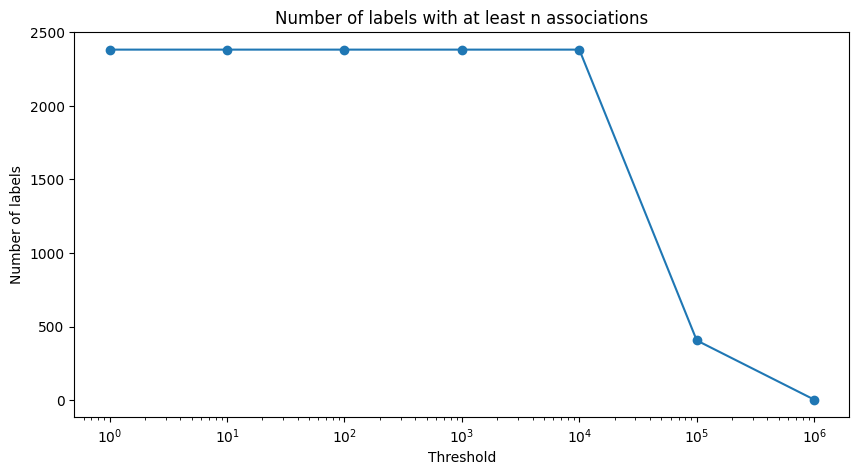

In [25]:
thresholds = [10**e for e in range(7)][::-1]
qualifying = []
for threshold in thresholds:
    qualifying.append(np.sum(np.array(n_assoc) >= threshold))
output = ""
for t, n in zip(thresholds, qualifying):
    output += f"{n:,} ({n / len(n_assoc) * 100:.3f}%) labels with at least {t:,} associations\n"
print(output)

fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(thresholds, qualifying, "o-")
ax.set_xscale("log")
ax.set_title("Number of labels with at least n associations")
ax.set_xlabel("Threshold")
ax.set_ylabel("Number of labels")
plt.show()

In [26]:
# how many points are there associated with at least 1 label with at least 15,000 associations?
large_labels = np.where(n_assoc >= 15000)[0]
print(f"{len(large_labels):,} labels with at least 15,000 associations")


2,382 labels with at least 15,000 associations


In [27]:
quantiles = [0.025, 0.05, 0.125, 0.25, 0.5, 0.75, 0.875, 0.95, 0.99, 0.999, 1.]
for q, n in zip(quantiles, np.quantile(n_assoc, quantiles)):
    print(f"{q:.3f}: {n:.0f}")

0.025: 20545
0.050: 21172
0.125: 23364
0.250: 27382
0.500: 40679
0.750: 74058
0.875: 125976
0.950: 247349
0.990: 491854
0.999: 1210773
1.000: 2194824


In [28]:
print(f"{np.sum(n_assoc):,} associations in total")

175,454,102 associations in total


## Mutually Exclusive Labels
Can we identify sets of labels which never co-occur?

In [29]:
# construct label co-occurrence matrix
cooccurrence_matrix = dataset_metadata.T.dot(dataset_metadata)

In [30]:
# compute the number of labels each label co-occurs with
n_cooccurrences = cooccurrence_matrix.getnnz(axis=0)
print("n_cooccurrences", n_cooccurrences.shape, n_cooccurrences.min(), n_cooccurrences.max())

n_cooccurrences (2382,) 0 0


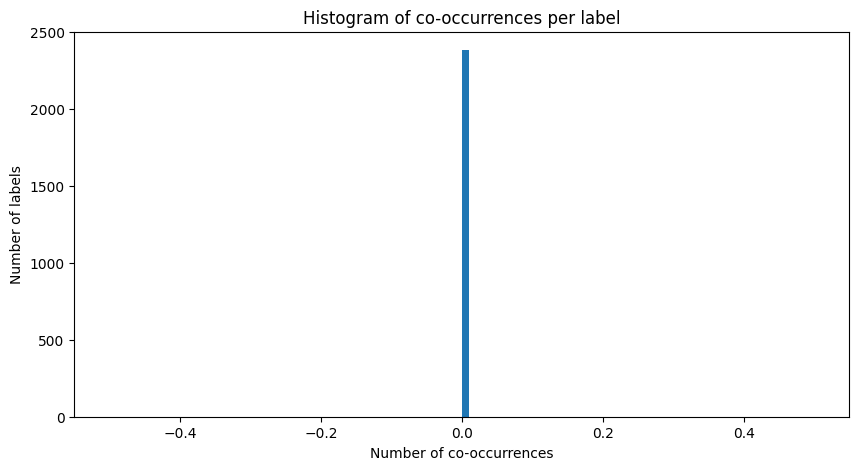

In [31]:
# plot histogram of n_coocurrences
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(n_cooccurrences, bins=100)
ax.set_title("Histogram of co-occurrences per label")
ax.set_xlabel("Number of co-occurrences")
ax.set_ylabel("Number of labels")

fig.show()

In [32]:
# are there any mutually inclusive labels?
# these should be indicated by values equal to the diagonal of the co-occurrence matrix


# Public Queries

In [33]:
query_md = yfcc.get_queries_metadata()
print(query_md)

  (0, 166)	1e-45
  (0, 7489)	1e-45
  (1, 134)	1e-45
  (1, 367)	1e-45
  (2, 10258)	1e-45
  (3, 11151)	1e-45
  (4, 393)	1e-45
  (5, 1590)	1e-45
  (6, 256)	1e-45
  (7, 246)	1e-45
  (7, 7069)	1e-45
  (8, 170)	1e-45
  (8, 1870)	1e-45
  (9, 99)	1e-45
  (9, 6515)	1e-45
  (10, 142)	1e-45
  (10, 652)	1e-45
  (11, 940)	1e-45
  (12, 3185)	1e-45
  (13, 8)	1e-45
  (13, 7123)	1e-45
  (14, 3)	1e-45
  (15, 145)	1e-45
  (16, 944)	1e-45
  (16, 1070)	1e-45
  :	:
  (9985, 110)	1e-45
  (9986, 56)	1e-45
  (9987, 21)	1e-45
  (9987, 1717)	1e-45
  (9988, 51)	1e-45
  (9988, 22402)	1e-45
  (9989, 703)	1e-45
  (9989, 2099)	1e-45
  (9990, 296)	1e-45
  (9990, 3050)	1e-45
  (9991, 261)	1e-45
  (9991, 850)	1e-45
  (9992, 218)	1e-45
  (9992, 2512)	1e-45
  (9993, 44)	1e-45
  (9993, 14523)	1e-45
  (9994, 2348)	1e-45
  (9994, 9468)	1e-45
  (9995, 0)	1e-45
  (9995, 48)	1e-45
  (9996, 622)	1e-45
  (9997, 31245)	1e-45
  (9998, 2549)	1e-45
  (9999, 468)	1e-45
  (9999, 3156)	1e-45


In [34]:
selectivities = n_assoc_full / dataset_metadata_full.shape[0]

In [35]:
n_criteria = query_md.getnnz(axis=1)
print(f"1 filter: {np.sum(n_criteria == 1):,}\n2 filters: {np.sum(n_criteria == 2):,}\n3 filters: {np.sum(n_criteria == 3)}")

1 filter: 4,920
2 filters: 5,080
3 filters: 0


In [36]:
queries = []
for i in range(query_md.shape[0]):
    queries.append(query_md[i, :].nonzero()[1])

In [37]:
single_queries = np.concatenate([arr for arr in queries if arr.size == 1])
double_queries = np.vstack([arr for arr in queries if arr.size == 2])

In [38]:
sq_select = n_assoc_full[single_queries] / dataset_metadata_full.shape[0]
sq_select

array([2.2410e-04, 2.1290e-04, 9.6359e-03, ..., 7.6375e-03, 3.4900e-05,
       1.3065e-03])

In [39]:
np.mean(sq_select * dataset_metadata_full.shape[0])

165839.88902439026

In [40]:
dq_select = n_assoc_full[double_queries[:, 0]] * n_assoc_full[double_queries[:, 1]] / dataset_metadata_full.shape[0]
dq_select

array([1.00791197e+02, 1.93255224e+03, 7.53232240e+01, ...,
       3.81712180e+00, 6.44360820e+04, 7.66973208e+01])

In [41]:
# 90th percentile selectivity for all queries
np.quantile(sq_select, 0.9) * dataset_metadata_full.shape[0]


422222.0

In [42]:
print(f"{np.count_nonzero(sq_select < 1e-3):,} single queries have selectivity < 0.001 s.t. they match <= 10,000 points ({np.count_nonzero(sq_select < 1e-3) / sq_select.shape[0] * 100:.3f}%)")
print(f"The median selectivity of single queries is {np.median(sq_select):.3f} ({int(np.median(sq_select) * dataset_metadata_full.shape[0]):,} points)")

print(f"{np.count_nonzero(dq_select < 1e-3):,} double queries have selectivity < 0.001 s.t. they match <= 10,000 points ({np.count_nonzero(dq_select < 1e-3) / dq_select.shape[0] * 100:.3f}%)")


1,226 single queries have selectivity < 0.001 s.t. they match <= 10,000 points (24.919%)
The median selectivity of single queries is 0.005 (49,051 points)
0 double queries have selectivity < 0.001 s.t. they match <= 10,000 points (0.000%)


In [43]:
# computing actual selectivity of double queries
# points_per_label = [frozenset(dataset_metadata_full[:, i].nonzero()[0]) for i in range(dataset_metadata_full.shape[1])]
# labels_per_point = [frozenset(dataset_metadata_full.indices[dataset_metadata_full.indptr[i]:dataset_metadata_full.indptr[i+1]]) for i in range(dataset_metadata_full.shape[0])]

In [44]:
most_frequent_filters = np.argsort(n_assoc_full)[::-1]

In [45]:
# 

In [46]:
def intersection(f1, f2):
    if n_assoc_full[f1] > n_assoc_full[f2]:
        f1, f2 = f2, f1
    output = 0
    for i in points_per_label_full[f1]:
        if i in points_per_label_full[f2]:
            output += 1
    return output

dq_select_actual = np.array([intersection(f1, f2) for f1, f2 in tqdm(double_queries)])

100%|██████████| 5080/5080 [00:44<00:00, 112.90it/s]


In [47]:
print(dq_select_actual[:50])
# print(double_queries[:50])
print(np.mean(dq_select_actual))
print(np.median(dq_select_actual))

[  137  3572   251   946   277  8971   745   442  1471 52321  1296  1475
  1751   960  6767   608 18112 44869  2015 10117   668   275   175  2177
   302   460   368  1353    97   192   533  7477   876 11779  1104   294
  8992    34   109   127   129  4881  2254  1198   127   123   968  2001
   102   748]
5136.780905511811
738.0


In [48]:
increase_factor = dq_select_actual / (dq_select * 10 ** 9)

print(f"median increase factor is {np.median(increase_factor):,.3f}")
print(f"mean increase factor is {np.mean(increase_factor):,.3f}")
print(f"max increase factor is {np.max(increase_factor):,.3f}")
print(f"min increase factor is {np.min(increase_factor):,.3f}")

# finding a value to multiply projected selectivity to minimize msse relative to actual selectivity
alpha = np.dot(dq_select, dq_select_actual) / np.dot(dq_select, dq_select)
f"{alpha:,}"

median increase factor is 0.000
mean increase factor is 0.000
max increase factor is 0.000
min increase factor is 0.000


'1.9178617947252474'

In [49]:
from scipy.optimize import minimize

def objective_function(alpha, A, B, x):
    # Calculate the count where both A[i] and B[i]*alpha are on the same side of x
    count = np.sum((A > x) == (B * alpha > x))
    # Negate the count because we're using a minimization function
    return -count

def find_optimal_alpha(A, B, x):
    result = minimize(objective_function, 12722288.092233118, args=(A, B, x), bounds=[(0, None)])
    return result.x[0] if result.success else None

find_optimal_alpha(dq_select, dq_select_actual, 10)

12722288.092233118

In [50]:
# print quantiles of selectivity
quantiles = [0.025, 0.05, 0.125, 0.25, 0.5, 0.75, 0.875, 0.95, 0.99, 0.999, 1.]

for q, n in zip(quantiles, np.quantile(dq_select_actual, quantiles)):
    print(f"{q:.3f}: {n:.0f}")

0.025: 87
0.050: 105
0.125: 149
0.250: 242
0.500: 738
0.750: 3070
0.875: 8254
0.950: 22005
0.990: 66815
0.999: 208172
1.000: 1227692


In [51]:
nontrivial_dq = dq_select_actual[dq_select_actual > 0]
print(f"Of the {len(nontrivial_dq):,} double queries with matches, the median selectivity is {int(np.median(nontrivial_dq))} points")

Of the 5,080 double queries with matches, the median selectivity is 738 points


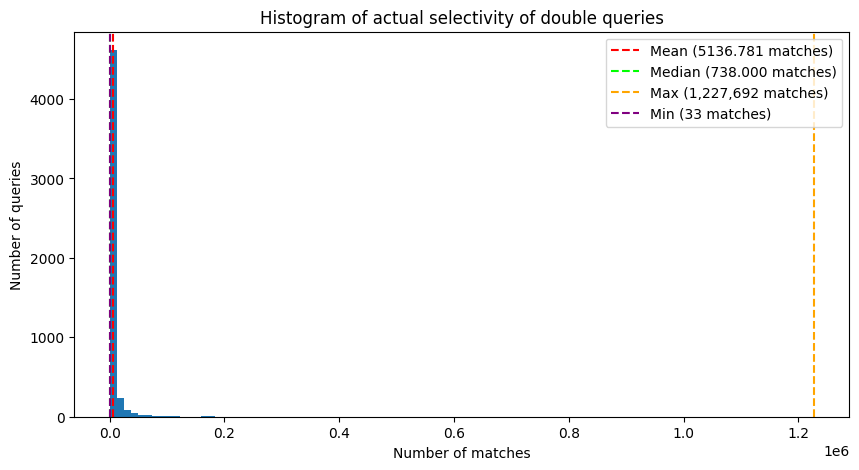

In [52]:
# plot a histogram of the selectivity of nontrivial double queries
fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(nontrivial_dq, bins=100)
ax.set_title("Histogram of actual selectivity of double queries")
ax.set_xlabel("Number of matches")
ax.set_ylabel("Number of queries")
ax.axvline(x=nontrivial_dq.mean(), color="red", label=f"Mean ({nontrivial_dq.mean():.3f} matches)", linestyle="--")
ax.axvline(x=np.median(nontrivial_dq), color="lime", label=f"Median ({np.median(nontrivial_dq):.3f} matches)", linestyle="--")
ax.axvline(x=np.max(nontrivial_dq), color="orange", label=f"Max ({np.max(nontrivial_dq):,} matches)", linestyle="--")
ax.axvline(x=np.min(nontrivial_dq), color="purple", label=f"Min ({np.min(nontrivial_dq):,} matches)", linestyle="--")
ax.legend(loc='upper right')
plt.show()

In [53]:
print(f"there are {np.count_nonzero(dq_select_actual >= 10_000):,} double queries with at least 10,000 matches ({100 * np.count_nonzero(dq_select_actual >= 10_000) / len(dq_select_actual):.3f}%)")
print(f"{np.count_nonzero(dq_select_actual < 10)} double queries have less than 10 matches ({100 * np.count_nonzero(dq_select_actual < 10) / len(dq_select_actual):.3f}%)")

there are 557 double queries with at least 10,000 matches (10.965%)
0 double queries have less than 10 matches (0.000%)


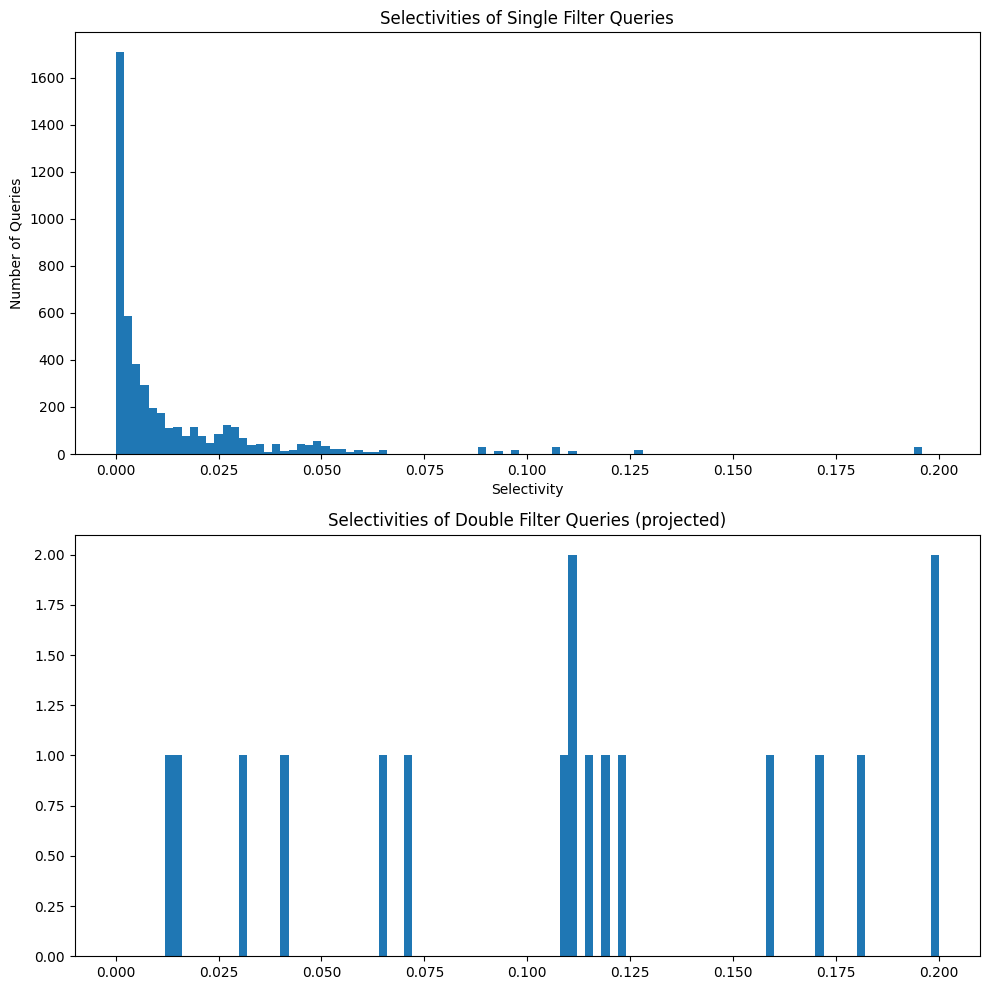

In [54]:
fig, ax = plt.subplots(2, 1, figsize=(10, 10))
ax[0].hist(sq_select, bins=100, range=(0, 0.2))
ax[0].set_title("Selectivities of Single Filter Queries")
ax[0].set_xlabel("Selectivity")
ax[0].set_ylabel("Number of Queries")
# ax[0].set_xscale("log")

ax[1].hist(dq_select, bins=100, range=(0, 0.2))
ax[1].set_title("Selectivities of Double Filter Queries (projected)")
ax[0].set_xlabel("Selectivity")
ax[0].set_ylabel("Number of Queries")

plt.tight_layout()

In [55]:
gt = yfcc.get_groundtruth()
print(gt[1].shape)
gt

(10000, 10)


(array([[6963556, 9029687,  244278, ..., 2138981, 6081377, 5379213],
        [5341130, 7797852, 4998860, ..., 9761954, 3419949, 1585740],
        [1522675, 3352265, 7283881, ..., 9999967, 9593588, 3628801],
        ...,
        [9837420, 2771599, 3501139, ..., 5400246, 6956511, 8591453],
        [9786473, 8984209, 7894765, ..., 1804511, 3403478, 4588353],
        [8976587, 3963410, 4668658, ..., 6912918, 7265729, 3590467]],
       dtype=int32),
 array([[ 58.818817,  62.760094,  63.540653, ...,  67.071106,  67.4751  ,
          67.49338 ],
        [  0.349905,  44.59743 ,  46.210953, ...,  59.682434,  60.628666,
          60.903008],
        [ 86.74049 ,  91.427345,  93.077255, ...,  95.49199 ,  95.552765,
          95.787735],
        ...,
        [ 38.963142,  40.529305,  41.004936, ...,  46.425148,  46.959816,
          47.23764 ],
        [ 45.360527,  45.489964,  46.148125, ...,  49.93415 ,  50.01693 ,
          50.26252 ],
        [103.28243 , 107.49292 , 108.5203  , ..., 118.3542

In [56]:
actual_matches = [n_assoc_full[i[0]] for i in queries]

In [57]:
dataset_metadata.count_nonzero()

175454102

## Chains of Label Sets
How many unique chains of weakly increasing sets of labels partially ordered by inclusion are there?

In [58]:
# create a list of sets where each element contains the labels associated with a data point
labels_per_data_point = [set(dataset_metadata.indices[dataset_metadata.indptr[i]:dataset_metadata.indptr[i+1]]) for i in range(dataset_metadata.shape[0])]
print(labels_per_data_point[0])

{5, 6, 7, 1038, 528, 1307, 28, 29, 798, 159, 555, 305, 563, 441, 318, 65, 76, 205, 2256, 1619, 609, 1768, 503, 632, 125}


In [59]:
def unique(lst):
    output = []
    for x in lst:
        if x not in output:
            output.append(x)
    return output

tab = "\t"
SUBSET_SIZE = 1_000_000

def rec_unique(lst):
    n = len(lst)
    if n > 10_000:
        print(f"{tab * round(log2(SUBSET_SIZE / n))}Splitting list of length {n:,} into two lists of length {n//2:,} and {n-n//2:,}")
    if n <= 100:
        return unique(lst)
    else:
        output = rec_unique(lst[:n//2])
        for x in rec_unique(lst[n//2:]):
            if x not in output:
                output.append(x)
        return output
    
# unique_label_sets = rec_unique(labels_per_data_point[:SUBSET_SIZE])

# UNIQUE_SETS_PATH = "unique_label_sets.txt"
# with open(UNIQUE_SETS_PATH, "w") as f:
#     for s in unique_label_sets:
#         for x in s:
#             f.write(f"{x} ")
#         f.write("\n")

In [60]:
# break up labels_per_data_point into a list of lists separated by the length of each list
split_labels_per_data_point = [[] for _ in range(1517 + 1)]
for s in (labels_per_data_point):
    split_labels_per_data_point[len(s)].append(sorted(s))


In [61]:
print(split_labels_per_data_point[5][0])

def list_eq(lst1, lst2):
    if len(lst1) != len(lst2):
        return False
    else:
        for i in range(len(lst1)):
            if lst1[i] != lst2[i]:
                return False
        return True
    
def lst_unique(lst):
    """return a version of lst with all duplicates removed"""
    output = []
    for x in lst:
        if not any(list_eq(x, y) for y in output):
            output.append(x)
    return output

def rec_lst_unique(lst, original_size=SUBSET_SIZE):
    """recursive version of lst_unique that splits into 2 sublists if n is large"""
    n = len(lst)
    if n > 50_000:
        print(f"{tab * round(log2(original_size / n))}Splitting list of length {n:,} into two lists of length {n//2:,} and {n-n//2:,}")
    if n <= 100:
        return lst_unique(lst)
    else:
        output = []
        a = rec_lst_unique(lst[:n//2], original_size)
        for b in rec_lst_unique(lst[n//2:], original_size):
            if not any(list_eq(b, c) for c in a):
                output.append(b)
        return output


[149, 388, 504, 526, 546]


In [62]:
# for i, lst in enumerate(split_labels_per_data_point):
#     print(f"Processing list of length {i:,} ({len(lst):,} lists)")
#     split_labels_per_data_point[i] = rec_lst_unique(lst, len(lst))
#     print(f"List of length {i:,} reduced to {len(split_labels_per_data_point[i]):,}")


In [63]:
print(split_labels_per_data_point[5])
print(f"{sum(len(lst) for lst in split_labels_per_data_point):,}")

[[149, 388, 504, 526, 546], [15, 28, 39, 190, 959], [272, 822, 994, 1198, 1508], [37, 46, 79, 515, 911], [125, 753, 930, 1176, 1443], [108, 188, 289, 382, 717], [0, 17, 319, 953, 1409], [29, 34, 355, 975, 1848], [1, 191, 318, 1617, 2123], [2, 28, 506, 528, 772], [0, 2, 351, 1024, 2043], [85, 225, 349, 583, 717], [3, 25, 39, 67, 1622], [28, 111, 363, 399, 614], [2, 5, 75, 205, 649], [151, 260, 460, 1002, 1702], [88, 93, 164, 1018, 1150], [110, 376, 672, 860, 1770], [90, 267, 601, 712, 2023], [42, 70, 361, 438, 1002], [29, 88, 587, 996, 2174], [26, 58, 204, 1673, 1905], [37, 104, 126, 805, 1934], [90, 124, 150, 670, 1555], [13, 14, 24, 187, 271], [139, 237, 745, 842, 2178], [61, 67, 106, 391, 399], [42, 71, 95, 104, 388], [49, 76, 173, 1321, 2097], [26, 160, 495, 793, 1943], [24, 360, 361, 556, 608], [22, 93, 334, 483, 1022], [10, 40, 138, 1260, 2109], [39, 93, 1332, 1959, 2009], [15, 181, 625, 1161, 1210], [0, 6, 314, 461, 1374], [15, 33, 214, 304, 364], [7, 447, 739, 798, 1158], [95, 1

In [64]:
frozen_labels_per_point = [frozenset(s) for s in labels_per_data_point]

In [65]:
unique_frozensets = frozenset(frozen_labels_per_point)

In [66]:
print(f"{len(unique_frozensets):,} unique sets of labels on points")

9,584,102 unique sets of labels on points


In [67]:
from collections import defaultdict

class InclusionChains:
    def __init__(self, set_collection):
        # Sort the sets by size for efficient comparison
        self.sorted_sets = sorted(set_collection, key=lambda x: len(x))
        
        # A dictionary to hold the longest chain ending at each set
        self.dp = {}
        
        # DAG to hold parent-child relationships
        self.dag = defaultdict(list)
        
        # Initialize with empty chain for each set
        for s in self.sorted_sets:
            self.dp[frozenset(s)] = []
    
    def build_dag(self):
        for i, s1 in enumerate(self.sorted_sets):
            for j, s2 in enumerate(self.sorted_sets[i+1:], start=i+1):
                if s1.issubset(s2):
                    if all(not s1.issubset(s3) or not s3.issubset(s2) for s3 in self.sorted_sets[i+1:j]):
                        self.dag[frozenset(s1)].append(frozenset(s2))
    
    def compute_chains(self):
        for s in self.sorted_sets:
            s_frozen = frozenset(s)
            current_chain = [s]
            for parent in self.dag[s_frozen]:
                if len(self.dp[parent]) + 1 > len(current_chain):
                    current_chain = self.dp[parent] + [s]
            self.dp[s_frozen] = current_chain
    
    def get_largest_elements_of_maximal_chains(self):
        # Sets that are not in the domain of the DAG are largest elements of maximal chains
        largest_elements = [s for s in self.sorted_sets if frozenset(s) not in self.dag]
        return largest_elements


In [68]:
# inc = InclusionChains(frozen_labels_per_point)
# print("Building DAG")
# inc.build_dag()
# print("Computing chains")
# inc.compute_chains()
# print("Getting largest elements")
# largest_elements = inc.get_largest_elements_of_maximal_chains()
# largest_elements

In [69]:
from gmpy2 import mpz

BITSIG_LENGTH = 1024
BITSIG_P = 0.05

class BitSignature:
    def __init__(self, random=True) -> None:
        if random:
            signature = np.random.choice([0, 1], size=BITSIG_LENGTH, p=[1 - BITSIG_P, BITSIG_P])
            self.signature = mpz("".join(str(x) for x in signature), 2)
        else:
            self.signature = mpz(0)

    def __eq__(self, other):
        return self.signature == other.signature

    # addition is bitwise or of signatures
    def __add__(self, other):
        new = BitSignature(False)
        new.signature = self.signature | other.signature


    def __lt__(self, other):
        return (self.signature & other.signature) == other.signature
    
    def __gt__(self, other):
        return (self.signature & other.signature) == self.signature 
    
    def __iadd__(self, other):
        self.signature |= other.signature
        return self

In [70]:
bitsigs = [BitSignature() for _ in range(len(n_assoc))]

In [71]:
class LabelSet:
    total_comparisons = 0
    exhaustive_comparisons = 0
    true_exhaustive_lt = 0

    def __init__(self, labels) -> None:
        self.labels = labels
        self.bitsig = BitSignature(False)
        for label in labels:
            self.bitsig += bitsigs[label]
        
    def __eq__(self, other):
        if self.bitsig != other.bitsig:
            return False
        else:
            return self.labels == other.labels

    def __lt__(self, other):
        LabelSet.total_comparisons += 1
        if self.bitsig < other.bitsig:
            LabelSet.exhaustive_comparisons += 1
            if self.labels.issubset(other.labels):
                LabelSet.true_exhaustive_lt += 1
                return True
            else:
                return False
        else:
            return False
        
    def __len__(self):
        return len(self.labels)

In [72]:
label_sets = [LabelSet(s) for s in unique_frozensets]

In [73]:
from tqdm import tqdm

LabelSet.total_comparisons = 0
LabelSet.exhaustive_comparisons = 0
LabelSet.true_exhaustive_lt = 0

def find_maximal_elements(set_collection):
    # Sort the sets by size for efficient comparison
    sorted_sets = sorted(set_collection, key=lambda x: len(x), reverse=True)
    
    # To hold the maximal elements
    maximal_elements = []
    
    for i, s1 in tqdm(enumerate(sorted_sets), total=len(sorted_sets)):
        is_maximal = True
        for s2 in sorted_sets[:i+1]:
            if s1 < s2:
                is_maximal = False
                break
        if is_maximal:
            print(f"Found maximal element of length {len(s1)}")
            maximal_elements.append(s1)
    
    return maximal_elements

maximal_elements = find_maximal_elements(label_sets)
maximal_elements

  0%|          | 47503/9584102 [14:38<48:57:45, 54.10it/s] 


KeyboardInterrupt: 

In [ ]:
print(f"Total comparisons: {LabelSet.total_comparisons:,}\nExhaustive comparisons: {LabelSet.exhaustive_comparisons:,} ({100 * LabelSet.exhaustive_comparisons / LabelSet.total_comparisons:.2f}%)\nTrue exhaustive lt: {LabelSet.true_exhaustive_lt:,} ({100 * LabelSet.true_exhaustive_lt / LabelSet.exhaustive_comparisons:.2f}%)")